In [1]:
import sys
import os
import numpy as np
import pandas as pd
import scvelo as scv
import scanpy as sc
import cellrank as cr

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [2]:
import PATH
from importlib import reload

In [3]:
from src._configure import Yaml_configurer
from src import _diffplot as dfp

/home/wergillius/Project/diffuse_differentiate/script/path_n_util.py
/home/wergillius/Project/diffuse_differentiate/machine_config.json


# model setting

- Epsilon_Linear_H256_d3  
    - 'TF_diff/Epsilon_Linear_H256_d3/lightning_logs/version_0'  
    - "configs/TF_atlas/TF_diff/H256_d3.yaml"    
&nbsp;
- Epsilon_Linear_H32_d3  
    - 'TF_diff/Epsilon_Linear_H32_d3/lightning_logs/version_0'
    - "configs/TF_atlas/TF_diff/H32_d3.yaml"

In [4]:
# model H256
# config 
model_config = os.path.join(PATH.main_dir, "configs/TF_atlas/TF_diff/H256_d3.yaml")
configs = Yaml_configurer(model_config)

# model checkpoint
relative_path = 'TF_diff/Epsilon_Linear_H256_d3/lightning_logs/version_0'
ckpt_path = dfp.get_ckpt_path(relative_path)

In [11]:
adata = sc.read_h5ad(
    os.path.join(PATH.main_dir, "data/TFAtlas/diff_cellrank_result.h5ad")
    )

```python
label_df = pd.read_csv("Figure3B_celltype_mapping.csv")
adata.obs['cell_type'] = label_df['predicted.id']
adata.write_h5ad(
    os.path.join(PATH.main_dir, "data/TFAtlas/diff_cellrank_result.h5ad")
    )
```

In [50]:
m7cells = adata.obs.query('`member_7_absorption` == 1').index

In [61]:
select = adata.obs.member_7_absorption == 1

In [64]:
from matplotlib import pyplot as plt

In [199]:
select = adata.obs.member_7_absorption.between(0.7,0.8)
np.sum(select)

362

In [200]:
np.where(select)

(array([  198,   270,   339,   600,   650,   795,  1084,  1184,  1498,
         1671,  1718,  1825,  1861,  1871,  2645,  3154,  3180,  3238,
         3482,  3553,  3903,  3939,  4004,  4128,  4168,  4179,  4421,
         4556,  4572,  4582,  4583,  4590,  4619,  4657,  5207,  5248,
         5468,  5524,  5601,  5860,  5887,  5947,  5987,  6055,  6121,
         6122,  6183,  6265,  6289,  6437,  6460,  6688,  6727,  6729,
         6730,  6731,  6735,  6736,  6737,  6738,  6739,  6740,  6742,
         6745,  6748,  6757,  6767,  6862,  6925,  6947,  6978,  7010,
         7051,  7053,  7138,  7151,  7169,  7190,  7238,  7254,  7282,
         7469,  7498,  7597,  7607,  7610,  7624,  7625,  7634,  7637,
         7641,  7646,  7684,  7736,  7767,  7770,  7835,  7885,  8023,
         8030,  8082,  8221,  8237,  8290,  8313,  8490,  8506,  8520,
         9072,  9344,  9355,  9413,  9418,  9423,  9424,  9426,  9431,
         9432,  9437,  9438,  9441,  9455,  9458,  9460,  9462,  9463,
      

In [211]:
np.where(np.logical_and(adata.obsm['X_umap'][select,0] < 3, adata.obsm['X_umap'][select,0] > 1))

(array([ 19, 287, 352]),)

In [212]:
np.where(select)[0][287]

19289

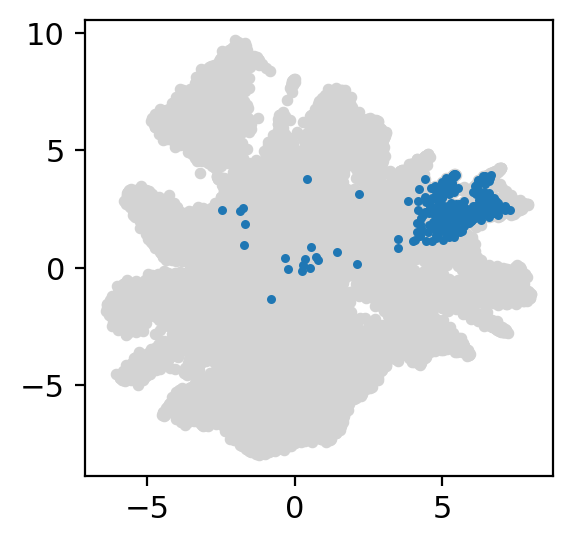

In [202]:
fig, ax = plt.subplots(1,1, figsize=(3,3), dpi=100)
ax.scatter(adata.obsm['X_umap'][:,0],  adata.obsm['X_umap'][:,1],  s=10, color = 'lightgray')
ax.scatter(adata.obsm['X_umap'][select,0],  adata.obsm['X_umap'][select,1], s=5)
# ax.axis("off")

(-7.114852643013, 8.742236351966858, -8.854014158248901, 10.569345235824585)

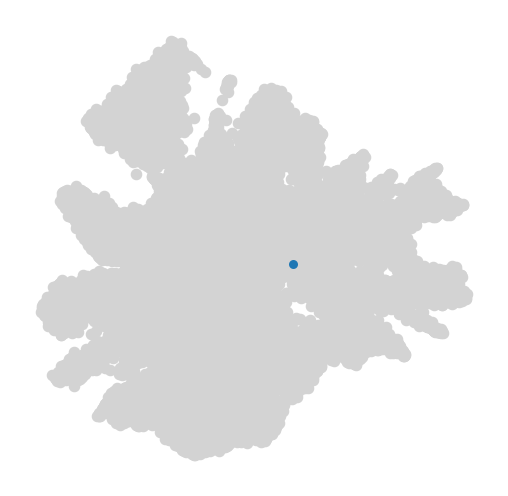

In [213]:
single_idx = 19289

fig, ax = plt.subplots(1,1, figsize=(3,3), dpi=100)
ax.scatter(adata.obsm['X_umap'][:,0],  adata.obsm['X_umap'][:,1],  s=10, color = 'lightgray')
ax.scatter(adata.obsm['X_umap'][single_idx,0],  adata.obsm['X_umap'][single_idx,1], s=5)
ax.axis("off")

In [22]:
from matplotlib import cm

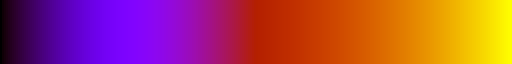

In [23]:
cm.gnuplot

(-7.114852643013, 8.742236351966858, -8.854014158248901, 10.569345235824585)

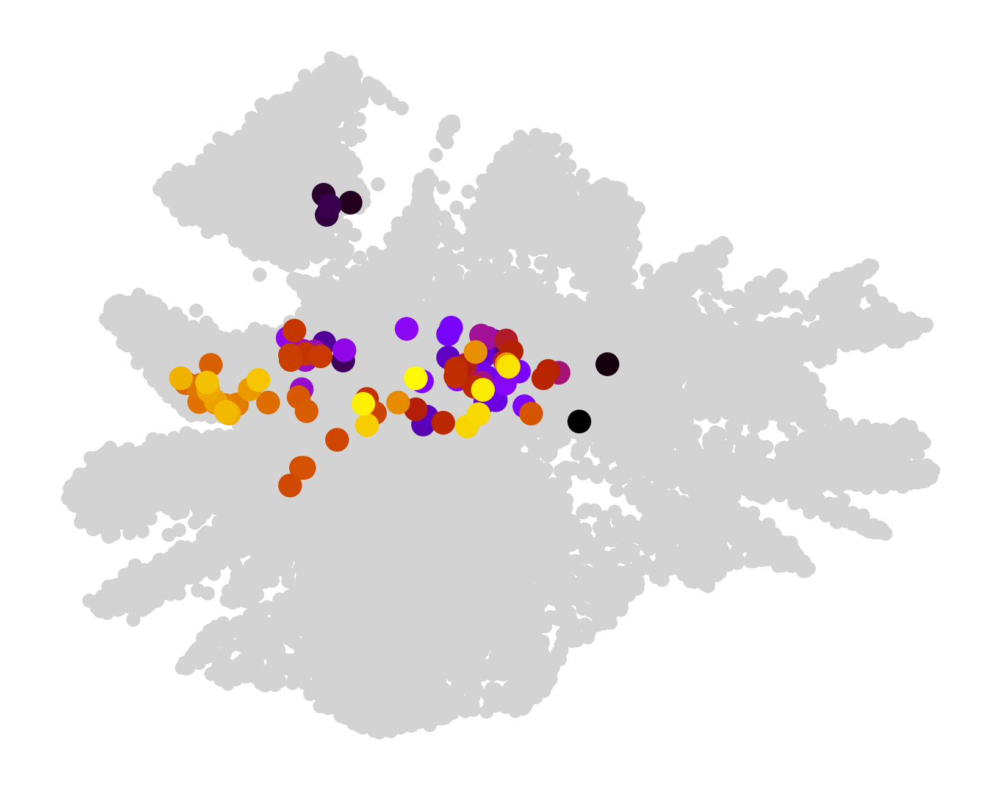

In [219]:
x,y = scv.utils.get_cell_transitions(adata, starting_cell = 19289, basis='umap', backward=False, n_steps=100)

fig, ax = plt.subplots(1,1, figsize=(5,4), dpi=200)
ax.scatter(adata.obsm['X_umap'][:,0],  adata.obsm['X_umap'][:,1],  s=10, color = 'lightgray')
# ax.scatter(adata.obsm['X_umap'][11124,0],  adata.obsm['X_umap'][11124,1], s=2)
n = len(x)
for i in range(n):
    ax.scatter(x[i], y[i], color = cm.gnuplot(i/n))
    
ax.axis("off")

# start perturbation  

with model H256

<font size=3> Now we choose to pertube cells with TF that are pro-state `5`, which is a very different lineage from `7-1`.

In [21]:
from importlib import reload

In [22]:
reload(dfp)

<module 'src._diffplot' from '/home/wergillius/Project/diffuse_differentiate/src/_diffplot.py'>

In [26]:
adata_zc, model  = dfp.plot_representation(
    yaml_path = model_config,
    ckpt_path = relative_path,
    use_rep = 'z_c',
    n_neighbors= 15,
    device = 0
)

loadin adata with 28825 cells, which normally takes around 5.54 mins


100%|██████████| 91/91 [00:01<00:00, 67.17it/s] 



cell embedding extracted, ready to computing KNN...

KNN constructed, computing UMAP...


In [98]:
adata_zc.obs = adata.obs.copy()

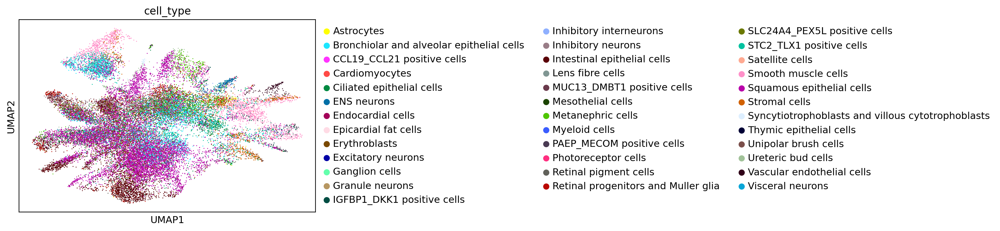

In [100]:
sc.pl.umap(adata, color=['cell_type'])

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


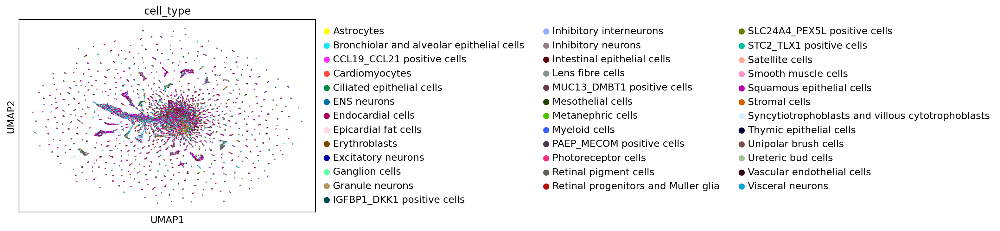

In [99]:
sc.pl.umap(adata_zc, color=['cell_type'])

In [31]:
adata_perturb, model  = dfp.perturbation(
    yaml_path = model_config,
    ckpt_path = relative_path,
    perturbation = 'TFORF0820-LHX6',
    n_neighbors= 15,
    device = 0,
    return_adata=True,
    compute_neighbor=True,
    compute_umap=True
)

loadin adata with 28825 cells, which normally takes around 5.54 mins


100%|██████████| 91/91 [00:01<00:00, 69.05it/s] 



cell embedding extracted, ready to computing KNN...

KNN constructed, computing UMAP...


In [34]:
adata_perturb.obs = adata.obs.copy()

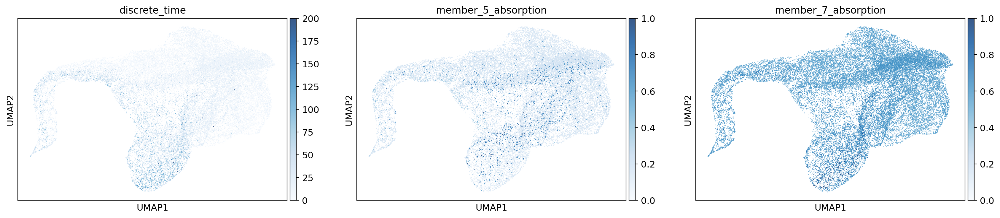

In [41]:
sc.pl.umap(adata_perturb, cmap='Blues', alpha=0.8,
           color=['discrete_time', 
                  'member_5_absorption',
                  'member_7_absorption'])

In [113]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [111]:
pLHX6_ad = dfp.compute_velocity(adata, 
                velocity_matrix = adata_perturb.obsm['delta_x'], 
                                n_jobs=20)

computing velocity graph (using 20/48 cores)


ImportError: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

# compute velocity similarity

In [73]:
from scipy.spatial.distance import cosine

In [123]:
import torch

In [78]:
from matplotlib import pyplot as plt

In [27]:
original_delta_x = adata_zc.obsm['delta_x']
pertub_delta_x = adata_perturb.obsm['delta_x']

In [115]:
same_perturb_cb = adata_zc.obs.query("`TF` == 'TFORF0820-LHX6'").index

In [ ]:
adata.uns

In [127]:
model = model.eval().to('cpu')

In [126]:
test_ad = adata[same_perturb_cb].copy()
test_X = torch.from_numpy(test_ad.X).float()
test_t = torch.from_numpy(test_ad.obs['discrete_time'].values)
test_c = test_ad.obs['TF'].values

In [147]:
c_vec = np.array([adata.uns['unique_token_dict'][c] for c in test_c])

In [132]:
adata.uns['unique_token_dict']['TFORF0098-MSGN1']

98

In [150]:
C1 = torch.from_numpy(c_vec)

In [137]:
C2 = torch.from_numpy(np.array([98]*6))

In [153]:
pred_deltaX= model.model(test_X, test_t, None, C.long()).detach().numpy()

In [146]:
pred_deltaX2= model.model(test_X, test_t, None, C2).detach().numpy()

In [155]:
1 - cosine(pred_deltaX[0], pred_deltaX2[0])

1

In [139]:
pred_deltaX2

tensor([[ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0040,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0126, -0.0037]],
       grad_fn=<NativeBatchNormBackward0>)

In [130]:
pred_deltaX

tensor([[ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0041,  ..., -0.0009,  0.0125, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0038],
        [ 0.0017, -0.0036, -0.0042,  ..., -0.0009,  0.0126, -0.0037]],
       grad_fn=<NativeBatchNormBackward0>)

In [64]:
exclude_cluster = ['5', '10', '12', '11', '10', '17']
sub_index = adata.obs.query('0.4 <= `member_7_absorption` <= 0.7').query(
      '`course_louvain` not in @exclude_cluster').index

subsect = [i in sub_index for i in adata.obs.index] 

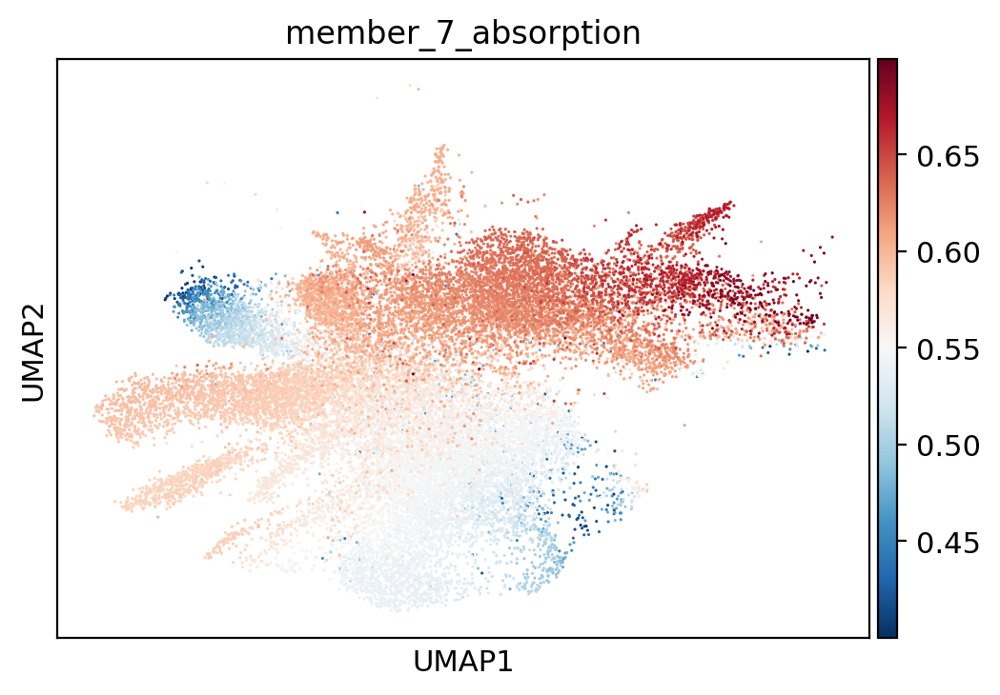

In [65]:
sc.pl.umap(adata[sub_index], color=['member_7_absorption'])

In [156]:
M = 1- np.array([cosine(p, o) for p,o in zip(pertub_delta_x, original_delta_x)])

In [157]:
np.max(M)

1.0

(array([2.0000e+00, 6.0000e+00, 1.0000e+00, 5.0000e+00, 4.0000e+00,
        9.0000e+00, 1.1000e+01, 2.6000e+01, 2.0000e+02, 2.8561e+04]),
 array([0.96430129, 0.96787116, 0.97144103, 0.9750109 , 0.97858077,
        0.98215064, 0.98572052, 0.98929039, 0.99286026, 0.99643013,
        1.        ]),
 <BarContainer object of 10 artists>)

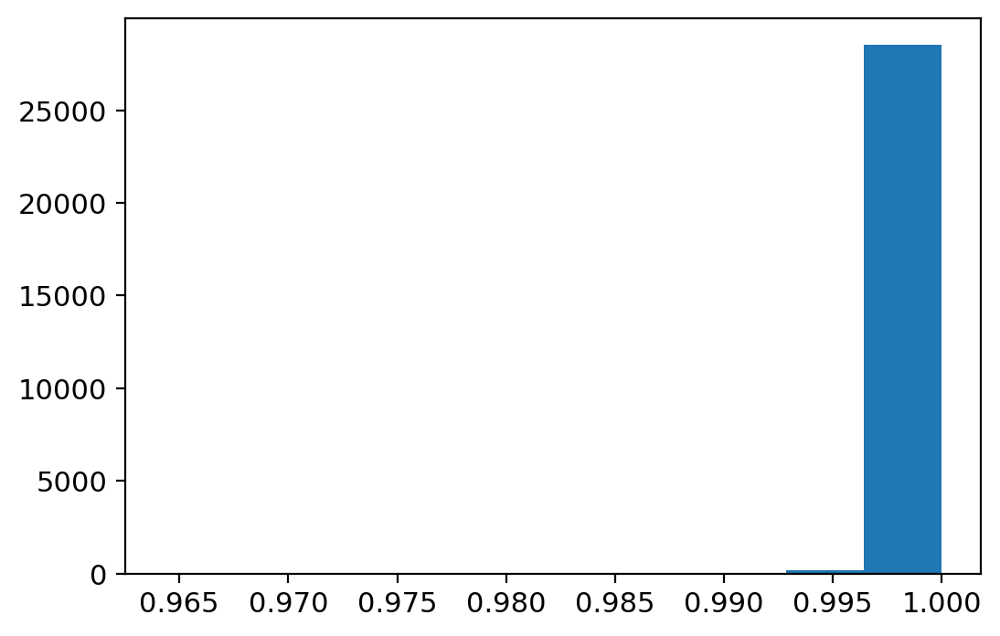

In [158]:
plt.hist(M)

# H32

In [7]:

# model H32
# config
H32_model_config = os.path.join(PATH.main_dir, "configs/TF_atlas/TF_diff/H32_d3.yaml")
H32_configs = Yaml_configurer(H32_model_config)

# model checkpoint
H32_relative_path = 'TF_diff/Epsilon_Linear_H32_d3/lightning_logs/version_0'
H32_ckpt_path = dfp.get_ckpt_path(relative_path)

In [8]:
H32_configs.check_samples

False

In [14]:
reload(dfp)

<module 'src._diffplot' from '/home/wergillius/Project/diffuse_differentiate/src/_diffplot.py'>

In [15]:
H32_adata_perturb, H32_model  = dfp.perturbation(
    yaml_path = H32_model_config,
    ckpt_path = H32_relative_path,
    perturbation = 'TFORF0820-LHX6',
    n_neighbors= 15,
    device = "cpu",
    return_adata=True,
    compute_neighbor=True,
    compute_umap=True
)

loadin adata with 28825 cells, which normally takes around 5.54 mins


100%|██████████| 91/91 [00:10<00:00,  8.43it/s]



cell embedding extracted, ready to computing KNN...

KNN constructed, computing UMAP...


In [176]:
H32_adata_perturb

AnnData object with n_obs × n_vars = 28825 × 4806
    obs: 'TF', 'batch', 'louvain', 'n_counts', 'n_genes', 'percent_mito', 'dpt_pseudotime', 'discrete_time', 'split', 'velocity_self_transition', 'is_large', 'Cluster Enriched TFs', 'course_louvain', 'course_cell_type', 'clusters_gradients', 'terminal_states', 'terminal_states_probs', 'member_11_1_absorption', 'member_11_2_absorption', 'member_12_absorption', 'member_7_absorption', 'member_5_absorption', 'member_6_absorption', 'cell_type', 'velocity_length', 'velocity_confidence'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'diffmap_evals', 'hvg', 'iroot', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap', 'unique_token_dict', 'z_c', 'cell_type_colors'
    obsm: 'X_diffmap', 'X_pca', 'X_pca_harmony', 'X_umap', 'delta_x', 'z_c', 'z', 'c'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'z_c_distances', 'z_c_connectivities'

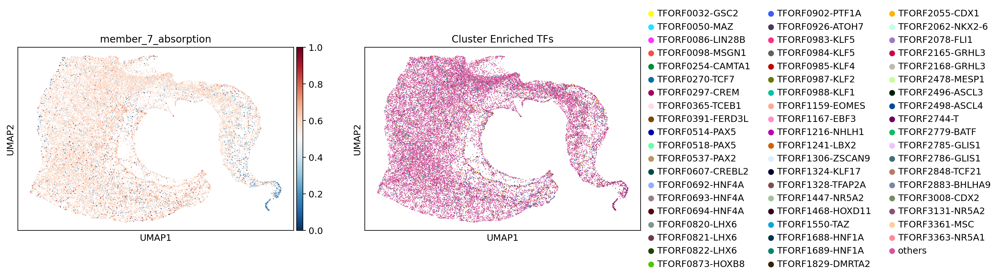

In [179]:
sc.pl.umap(H32_adata_perturb,  color=['member_7_absorption','Cluster Enriched TFs'])

```python
H32_adata_perturb.write_h5ad("H32_adata_perturb-LHX6.h5ad")
torch.save(H32_model, "/home/wergillius/Project/diffuse_differentiate/some_tutorials/TF-atlas/H32_model.ckpt")
```

In [20]:
H32_adata_perturb.obs  = adata.obs

In [23]:
import torch

In [24]:
torch.cuda.is_available()

False

In [22]:
pLHX6_ad = dfp.compute_velocity(adata, 
                velocity_matrix = H32_adata_perturb.obsm['delta_x'], 
                                n_jobs=1, basis='umap', n_neighbor=5)

computing velocity graph (using 20/48 cores)


  0%|          | 0/28825 [00:00<?, ?cells/s]

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:39:17) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [25]:
pLHX6_ad.obsm['delta_x'] = H32_adata_perturb.obsm['delta_x']

In [26]:
pLHX6_ad.write_h5ad("H32_adata_perturb-LHX6_velo.h5ad")

In [5]:
pLHX6_ad = sc.read_h5ad("H32_adata_perturb-LHX6_velo.h5ad")

In [6]:
subgroup = ['0', '3', '9-2', '11-0', '11-1', '12-1',  '12-0', '7-0', '13', '7-1', '7-2']
pLHX6_ad.obs['sub_group'] = pLHX6_ad.obs.louvain.isin(subgroup).astype(int)

In [13]:
adata.obs['sub_group'] = adata.obs.louvain.isin(subgroup).astype(int)

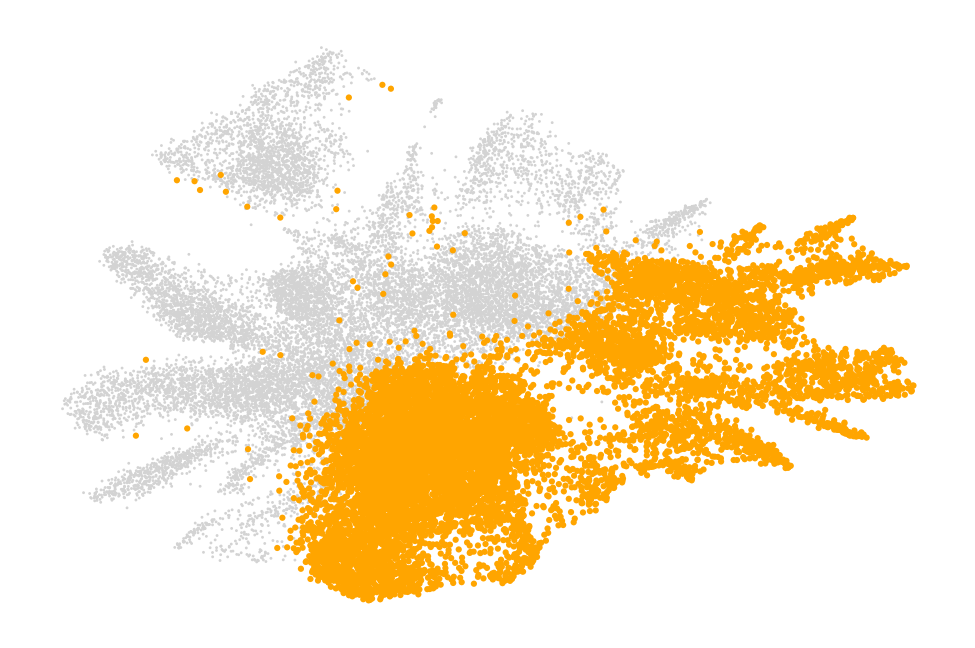

In [18]:
fig = sc.pl.umap(adata, return_fig=True, show=False)
ax = fig.gca()
ax.axis("off")
sc.pl.umap(adata[adata.obs.louvain.isin(subgroup)], return_fig=False,
            ax = ax, size=20 , na_color='orange')


In [ ]:
adata[adata.obs.louvain.isin(subgroup)]

AnnData object with n_obs × n_vars = 28825 × 4806
    obs: 'TF', 'batch', 'louvain', 'n_counts', 'n_genes', 'percent_mito', 'dpt_pseudotime', 'discrete_time', 'split', 'velocity_self_transition', 'is_large', 'Cluster Enriched TFs', 'course_louvain', 'course_cell_type', 'clusters_gradients', 'terminal_states', 'terminal_states_probs', 'member_11_1_absorption', 'member_11_2_absorption', 'member_12_absorption', 'member_7_absorption', 'member_5_absorption', 'member_6_absorption', 'cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Cluster Enriched TFs_colors', 'batch_colors', 'clusters_gradients_colors', 'coarse_fwd', 'course_louvain_colors', 'diffmap_evals', 'eigendecomposition_fwd', 'hvg', 'iroot', 'is_large_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'schur_matrix_fwd', 'terminal_states_colors', 'umap', 'unique_token_dict', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_dif

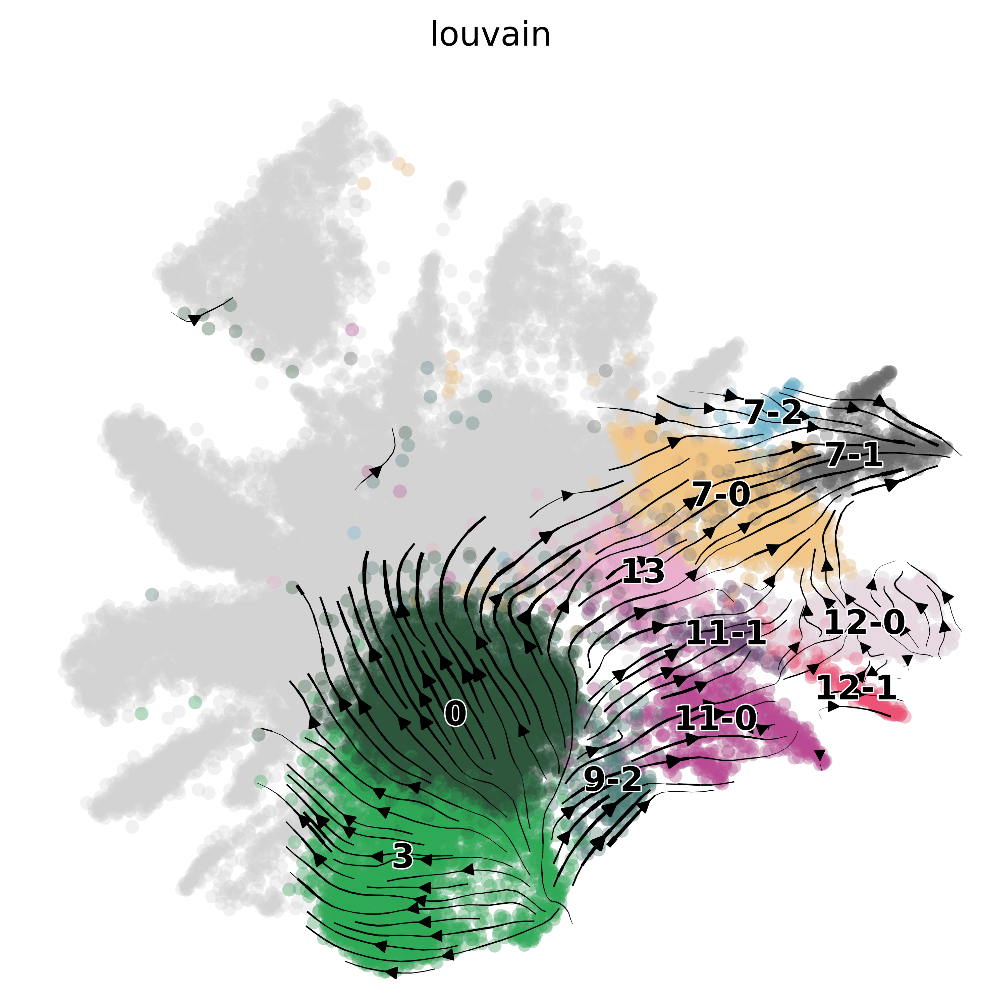

In [9]:
scv.pl.velocity_embedding_stream(pLHX6_ad, legend_loc='on data', groups=subgroup, 
n_neighbors=2, density=2.4,  min_mass = 3, 
                                 figsize=(6,6), dpi=300)

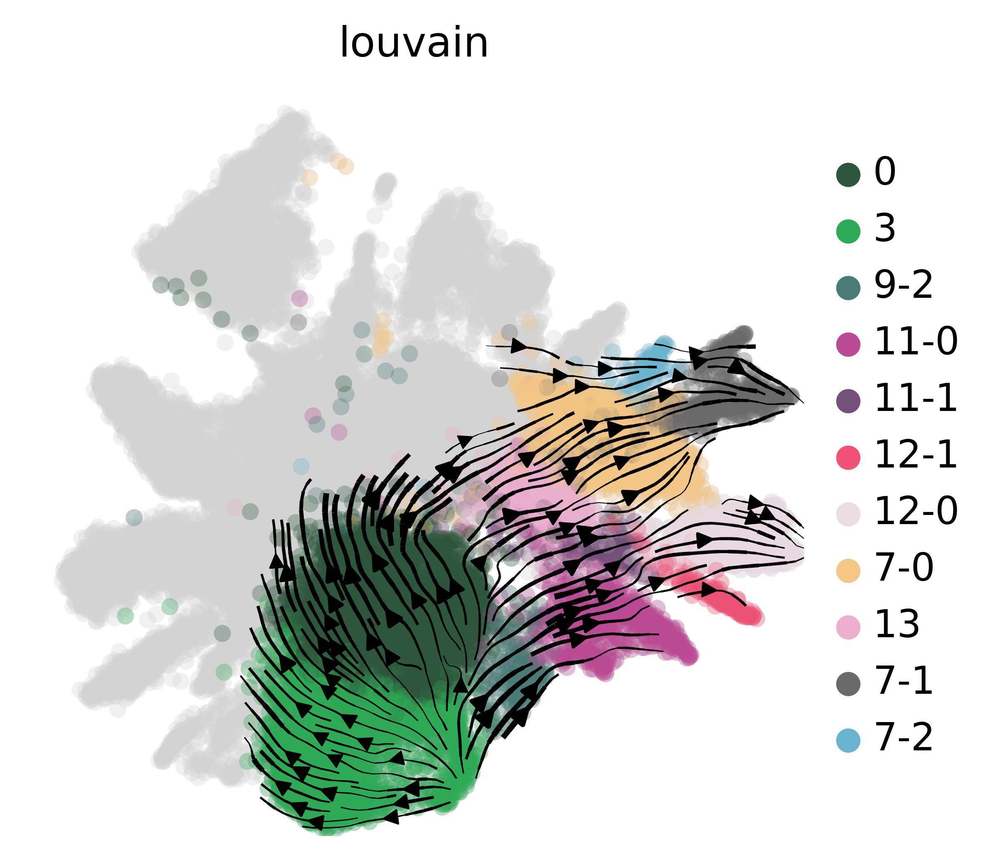

In [393]:
scv.pl.velocity_embedding_stream(adata, legend_loc='right margin', groups=subgroup, 
n_neighbors=2, density=2.4,  min_mass = 3,
                                 figsize=(4,4), dpi=300)

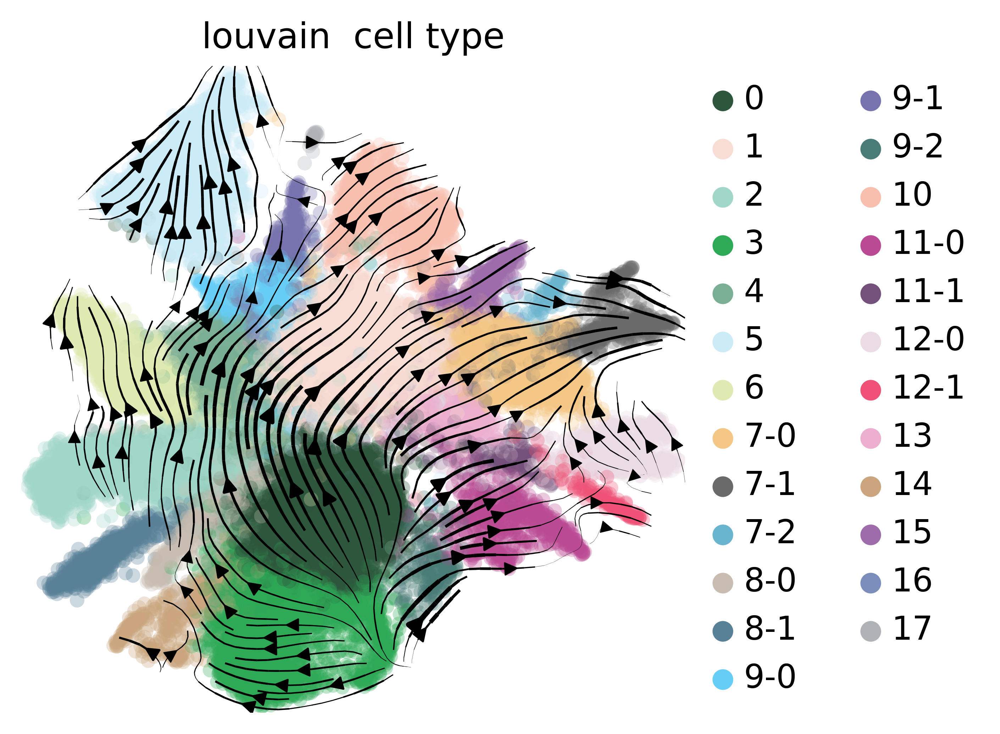

In [34]:
scv.pl.velocity_embedding_stream(pLHX6_ad, legend_loc='right margin', layer = 'cell_type',
                                 figsize=(4,4), dpi=300)

In [21]:
cm.gnuplot

NameError: name 'cm' is not defined

In [20]:
seed = np.random.randint(0,10000)
print(seed)
x,y = scv.utils.get_cell_transitions(pLHX6_ad, starting_cell = 28297, basis='umap', backward=True, n_steps=100, random_state=seed)

fig, ax = plt.subplots(1,1, figsize=(4,4), dpi=100)
ax.scatter(pLHX6_ad.obsm['X_umap'][:,0],  pLHX6_ad.obsm['X_umap'][:,1],  s=10, color = 'lightgray')
# ax.scatter(adata.obsm['X_umap'][11124,0],  adata.obsm['X_umap'][11124,1], s=2)
n = len(x)
for i in range(n):
    ax = ax.scatter(x[i], y[i], color = cm.gnuplot(i/n))
    
ax.axis("off")
ax.set_title(seed)

326


NameError: name 'plt' is not defined

In [38]:
import cellrank as cr
from cellrank.tl import kernels

In [39]:
vk = kernels.VelocityKernel(pLHX6_ad, xkey='X').compute_transition_matrix()
pLHX6_ad.obsp['velo_kernel_transition'] = vk.transition_matrix

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/28825 [00:00<?, ?cell/s]

Setting `softmax_scale=88.9965`


  0%|          | 0/28825 [00:00<?, ?cell/s]

    Finish (0:05:47)


In [40]:
ck = kernels.ConnectivityKernel(adata).compute_transition_matrix()
pk = kernels.PseudotimeKernel(adata).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing transition matrix based on `dpt_pseudotime`


  0%|          | 0/28825 [00:00<?, ?cell/s]

    Finish (0:00:16)


In [ ]:
combined_kernel = 0.8 * vk + 0.1 * ck + 0.1 * pk

In [ ]:
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
g.compute_schur(n_components=20)
g.plot_spectrum()

In [ ]:
g.compute_macrostates(n_states=6, cluster_key="louvain")
g.plot_macrostates()

In [ ]:
g.plot_macrostates(same_plot=False)

In [ ]:
g.compute_terminal_states()

In [ ]:
g.compute_absorption_probabilities(use_petsc=True, solver='gmres')
for i, n in enumerate(g.absorption_probabilities.names):
    adata.obs[f'm_{n}_absP'] = g.absorption_probabilities.X[:,i]